## Let's look at the 55 classes of finnish traffic signs (Orignal SVG files)

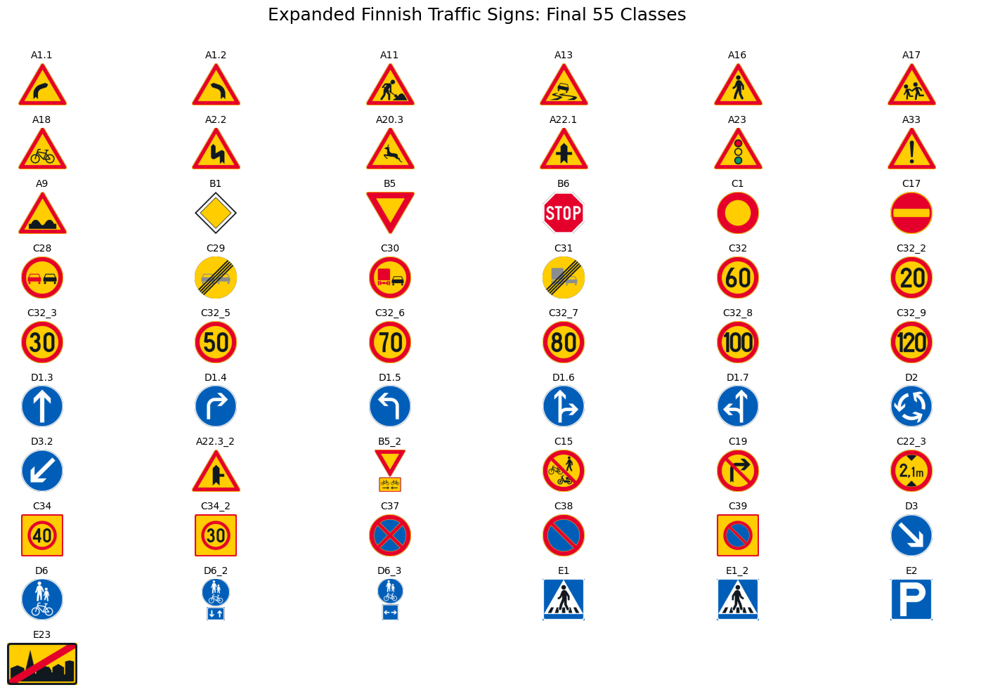

In [2]:
import os
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from matplotlib.image import imread
from cairosvg import svg2png
from io import BytesIO

# Path to the folder containing SVG files
svg_folder = r'C:\Users\ali\workspace\jamk_thesis\thesis_work\orignal_svgs_55_classes\svgs_for_yolo_dataset'

# List of traffic sign classes
traffic_sign_classes =['A1.1', 'A1.2', 'A11', 'A13', 'A16', 'A17', 'A18', 'A2.2', 'A20.3', 'A22.1', 'A23', 'A33', 'A9', 'B1', 'B5', 'B6', 'C1', 'C17', 'C28', 'C29', 'C30', 'C31', 'C32', 'C32_2', 'C32_3', 'C32_5', 'C32_6', 'C32_7', 'C32_8', 'C32_9', 'D1.3', 'D1.4', 'D1.5', 'D1.6', 'D1.7', 'D2', 'D3.2', 'A22.3_2', 'B5_2', 'C15', 'C19', 'C22_3', 'C34', 'C34_2', 'C37', 'C38', 'C39', 'D3', 'D6', 'D6_2', 'D6_3', 'E1', 'E1_2', 'E2', 'E23']

# Prepare the figure for a collage
n_cols = 6  # Number of columns in the collage
n_rows = -(-len(traffic_sign_classes) // n_cols)  # Calculate rows dynamically
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))
axes = axes.flatten()

# Iterate through traffic sign classes and corresponding axes
for idx, (cls, ax) in enumerate(zip(traffic_sign_classes, axes)):
    # Path to the SVG file
    svg_path = os.path.join(svg_folder, f"{cls}.svg")
    
    if os.path.exists(svg_path):
        # Convert SVG to PNG for rendering
        png_data = BytesIO()
        svg2png(url=svg_path, write_to=png_data)
        img = imread(BytesIO(png_data.getvalue()))
        
        # Display the image
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(cls, fontsize=10, pad=5)
    else:
        # If the SVG file doesn't exist, leave the space empty
        ax.axis('off')
        ax.set_title(f"{cls} (Missing)", fontsize=10, pad=5, color='red')

# Turn off any remaining empty axes
for ax in axes[len(traffic_sign_classes):]:
    ax.axis('off')

# Add a title to the collage
plt.suptitle('Expanded Finnish Traffic Signs: Final 55 Classes', fontsize=18)
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

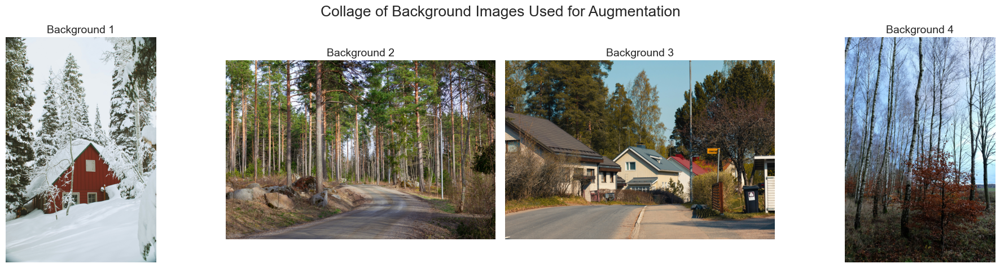

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import os

# Path to the folder containing background images
background_images_folder = r"C:\Users\ali\workspace\jamk_thesis\thesis_work\creating_new_dataset\backgrounds"
background_image_files = [os.path.join(background_images_folder, f) for f in os.listdir(background_images_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Ensure there are exactly 4 images for the collage
assert len(background_image_files) == 4, "Ensure exactly 4 background images are present in the folder."

# Set up Seaborn style for the plot
sns.set_theme(style="whitegrid")

# Create a figure for the collage in a single row
fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1 row, 4 columns

# Titles for each image (optional, you can customize or remove these)
titles = ["Background 1", "Background 2", "Background 3", "Background 4"]

# Loop through images and display them
for ax, img_path, title in zip(axes, background_image_files, titles):
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.set_title(title, fontsize=14)
    ax.axis("off")  # Remove axes for cleaner visualization

# Add a main title for the collage
plt.suptitle("Collage of Background Images Used for Augmentation", fontsize=19, y=0.95)

# Adjust layout and display the collage
plt.tight_layout()
plt.show()


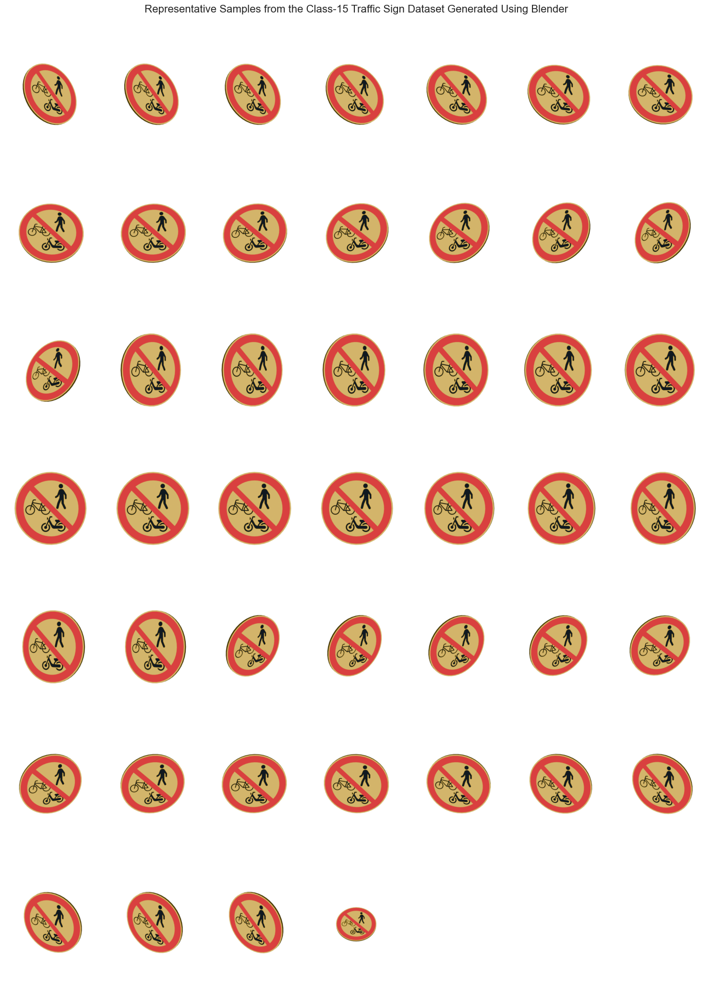

In [13]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

# Path to the folder containing C15 traffic sign images
dataset_folder = r"C:\Users\ali\workspace\jamk_thesis\thesis_work\creating_new_dataset\transparent_dataset\C15\transparent"

# Parameters for skipping images
skip_interval = 4  # Dynamically skip every 5 images
images = sorted([os.path.join(dataset_folder, f) for f in os.listdir(dataset_folder) if f.endswith(('.png', '.jpg', '.jpeg'))])
selected_images = images[::skip_interval]  # Select every `skip_interval`th image

# Ensure at least some images are selected
assert len(selected_images) > 0, "No images selected. Check the dataset path or adjust the skip interval."

# Set up Seaborn style
sns.set_theme(style="whitegrid")

# Define the grid size dynamically based on the number of selected images
n_cols = 7  # Number of columns in the collage
n_rows = (len(selected_images) + n_cols - 1) // n_cols  # Calculate rows needed

# Create the figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 3))

# Flatten axes array for easier iteration
axes = axes.flatten()

# Loop through selected images and plot them
for ax, img_path in zip(axes, selected_images):
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.axis("off")  # Turn off axes for a cleaner look

# Turn off unused axes
for ax in axes[len(selected_images):]:
    ax.axis("off")

# Add a main title to the collage
plt.suptitle("Representative Samples from the Class-15 Traffic Sign Dataset Generated Using Blender", fontsize=16, y=0.99)

# Adjust layout and show the collage
plt.tight_layout()
plt.show()


## Pre-Process Dataset for Model Training & Testing

In [5]:
import os
import json
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split
import re

def sanitize_filename(filename):
    # Replace any character that is not alphanumeric, underscore, hyphen, or dot
    return re.sub(r'[^\w\.-]', '_', filename)

# Set the base directory and train/test directories
# base_dir = r'C:\Users\ali\workspace\jamk_thesis\thesis_work\latest_dataset\56_classes'
base_dir = r'D:\dataset\pure_python_genrated_dataset'
output_dir = r'D:\dataset\structhured_dataset'
train_dir = os.path.join(output_dir, 'train')
test_dir = os.path.join(output_dir, 'test')

# Create train and test directories outside the "56_classes" folder
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Lists to hold image file paths and labels for the CSV files
train_data = []
test_data = []
class_label_Id_mapping_dict = {}
train_classes = []
test_classes = []


new_classes = {"A1.1": "0", "A1.2": "1", "A11": "2", "A13": "3", "A16": "4", "A17": "5", "A18": "6", "A2.2": "7", "A20.3": "8", "A22.1": "9", "A23": "10", "A33": "11", "A9": "12", "B1": "13", "B5": "14", "B6": "15", "C1": "16", "C17": "17", "C28": "18", "C29": "19", "C30": "20", "C31": "21", "C32": "22", "C32_2": "23", "C32_3": "24", "C32_5": "25", "C32_6": "26", "C32_7": "27", "C32_8": "28", "C32_9": "29", "D1.3": "30", "D1.4": "31", "D1.5": "32", "D1.6": "33", "D1.7": "34", "D2": "35", "D3.1": "36", "D3.2": "37", "A22.3_2": "38", "B5_2": "39", "C15": "40", "C19": "41", "C22_3": "42", "C34": "43", "C34_2": "44", "C37": "45", "C38": "46", "C39": "47", "D3": "48", "D6": "49", "D6_2": "50", "D6_3": "51", "E1": "52", "E1_2": "53", "E2": "54", "E23": "55"}


# Counter for unique filenames
unique_counter = 0

# Traverse through all subdirectories and files in the base directory
for root, dirs, files in os.walk(base_dir):
    # Filter for image files (e.g., .jpg, .jpeg, .png, .svg)
    images = [f for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png', '.svg'))]
    
    # If there are images in the directory, process them
    if images:
        # Split images into train and test sets
        train_images, test_images = train_test_split(images, test_size=0.3, random_state=42)
        
        # Get the class label from the class directory
        # The class label is the parent directory of the current directory
        class_label = os.path.basename(os.path.dirname(root))
        class_label_sanitized = sanitize_filename(class_label)
        
        # Get the subdirectory name
        sub_dir = os.path.basename(root)
        sub_dir_sanitized = sanitize_filename(sub_dir)
        
        # Process and copy the train images
        for img_name in train_images:
            src_path = os.path.join(root, img_name)
            img_name_sanitized = sanitize_filename(img_name)
            
            if class_label not in train_classes:
                train_classes.append(class_label)
                class_label_Id_mapping_dict[int(new_classes[class_label])] = class_label
                dst_dirs = os.path.join(train_dir, f"{int(new_classes[class_label])}")
                os.makedirs(dst_dirs, exist_ok=True)

            # Create a unique filename
            unique_filename = f"{int(new_classes[class_label])}/{class_label_sanitized}_{sub_dir_sanitized}_{img_name_sanitized}"

            # Check for filename collision
            dst_path = os.path.join(train_dir, f"{unique_filename}")
            if os.path.exists(dst_path):
                unique_counter += 1
                name, ext = os.path.splitext(unique_filename)
                unique_filename = f"{int(new_classes[class_label])}/{name}_{unique_counter}{ext}"
                dst_path = os.path.join(train_dir, unique_filename)
            
            # Copy the image and record the data
            shutil.move(src_path, dst_path)
            train_data.append({'filename': unique_filename, 'class': class_label, 'classId': int(new_classes[class_label])})
        
        # Process and copy the test images
        for img_name in test_images:
            src_path = os.path.join(root, img_name)
            img_name_sanitized = sanitize_filename(img_name)
            
            # Create a unique filename
            unique_filename = f"{class_label_sanitized}_{sub_dir_sanitized}_{img_name_sanitized}"
            
            # Check for filename collision
            dst_path = os.path.join(test_dir, unique_filename)
            if os.path.exists(dst_path):
                unique_counter += 1
                name, ext = os.path.splitext(unique_filename)
                unique_filename = f"{name}_{unique_counter}{ext}"
                dst_path = os.path.join(test_dir, unique_filename)
            
            # Copy the image and record the data
            shutil.move(src_path, dst_path)
            test_data.append({'filename': unique_filename, 'class': class_label, 'classId': int(new_classes[class_label])})

# Create DataFrames for train and test data
train_df = pd.DataFrame(train_data)
test_df = pd.DataFrame(test_data)

# Save the DataFrames to CSV files outside the "56_classes" folder
train_csv_path = os.path.join(output_dir, 'Train.csv')
test_csv_path = os.path.join(output_dir, 'Test.csv')
train_df.to_csv(train_csv_path, index=False)
test_df.to_csv(test_csv_path, index=False)

print(f"Train and test split completed. CSV files created at {train_csv_path} and {test_csv_path}.")

print(json.dumps(class_label_Id_mapping_dict))

Train and test split completed. CSV files created at D:\dataset\structhured_dataset\Train.csv and D:\dataset\structhured_dataset\Test.csv.
{"0": "A1.1", "1": "A1.2", "2": "A11", "3": "A13", "4": "A16", "5": "A17", "6": "A18", "7": "A2.2", "8": "A20.3", "9": "A22.1", "10": "A23", "11": "A33", "12": "A9", "13": "B1", "14": "B5", "15": "B6", "16": "C1", "17": "C17", "18": "C28", "19": "C29", "20": "C30", "21": "C31", "22": "C32", "23": "C32_2", "24": "C32_3", "25": "C32_5", "26": "C32_6", "27": "C32_7", "28": "C32_8", "29": "C32_9", "30": "D1.3", "31": "D1.4", "32": "D1.5", "33": "D1.6", "34": "D1.7", "35": "D2", "36": "D3.1", "37": "D3.2", "38": "A22.3_2", "39": "B5_2", "40": "C15", "41": "C19", "42": "C22_3", "43": "C34", "44": "C34_2", "45": "C37", "46": "C38", "47": "C39", "48": "D3", "49": "D6", "50": "D6_2", "51": "D6_3", "52": "E1", "53": "E1_2", "54": "E2", "55": "E23"}


## Unfortunately In my classifier dataset i had 56 classes which were actually 55 classes as Finnish Traffic Agency had same class twice D3, D3.1

## Look at dataset for model training.

#### Dataset Created with the help of Blender and Python OpenCV module.

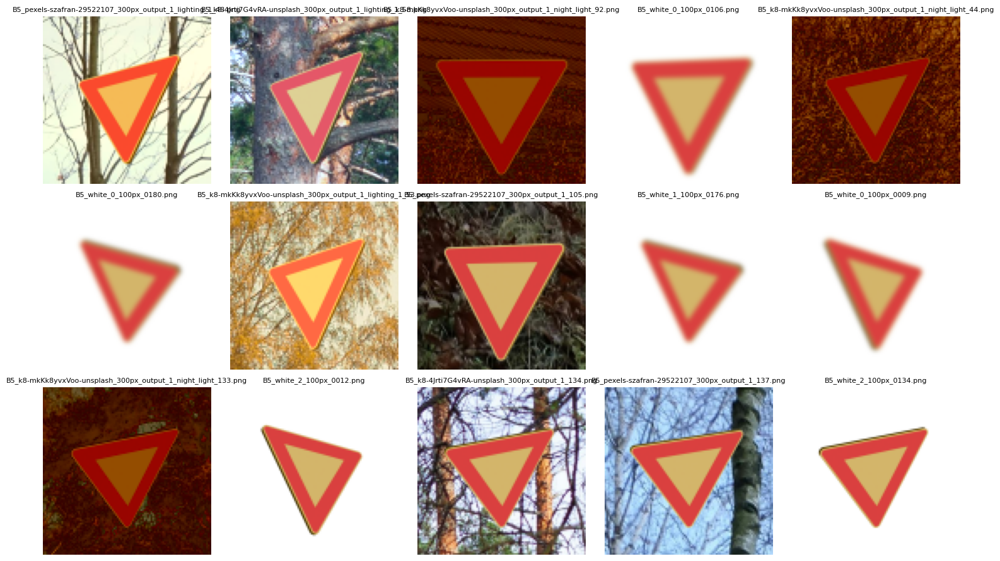

In [2]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

def display_collage(base_dir, num_cols=4, num_images=15, skip=0):
    """
    Display a collage of images from a directory, skipping a dynamic number of images.

    :param base_dir: Path to the directory containing images
    :param num_cols: Number of columns in the collage
    :param num_images: Number of images to display in the collage
    :param skip: Number of images to skip at the start of the directory
    """
    # Get the list of image files in the base directory
    images = [f for f in os.listdir(base_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    
    # Skip the specified number of images
    images = images[skip:]

    # Randomly select the desired number of images
    selected_images = random.sample(images, min(num_images, len(images)))

    # Calculate rows needed for the collage
    num_rows = (len(selected_images) + num_cols - 1) // num_cols

    # Create the collage
    plt.figure(figsize=(num_cols * 3, num_rows * 3))  # Adjust size dynamically

    for i, image_name in enumerate(selected_images):
        image_path = os.path.join(base_dir, image_name)
        img = Image.open(image_path)

        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(img)
        plt.axis('off')  # Turn off axis
        plt.title(image_name, fontsize=8)

    plt.tight_layout()
    plt.show()

# Example usage
base_dir = r'D:\dataset\structhured_dataset\train\14' 
num_cols = 5  # Number of columns
num_images = 15  # Number of images to display
skip = 10  # Number of images to skip

display_collage(base_dir, num_cols=num_cols, num_images=num_images, skip=skip)


## Extending EfficientNetB0 for Enhanced Traffic Sign Classification
Adapting and re-training EfficientNetB0 using transfer learning with an expanded dataset of 55 traffic sign classes to improve model performance.

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import os
import cv2

from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, load_model, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dropout, Flatten, Dense, GlobalAveragePooling2D, BatchNormalization

In [8]:
# Setting variables for later use
data_ = []
labels_ = []
classes = 56

# Retrieving the images and their labels
for i in range(classes):
    path = os.path.join(r"D:\dataset\structhured_dataset\\", "Train", str(i))

    # Check if the folder exists
    if not os.path.exists(path):
        print(f"Folder {path} does not exist. Skipping class {i}.")
        continue  # Skip this iteration if folder does not exist

    images = os.listdir(path)

    for a in images:
        try:
            image = Image.open(os.path.join(path, a))
            # Convert to RGB if not already in that format
            image = image.convert("RGB")
            image = image.resize((100, 100))
            image = np.array(image)
            
            # Check if the image has the correct shape
            if image.shape == (100, 100, 3):
                data_.append(image)
                labels_.append(i)
            else:
                print(f"Image {a} has an unexpected shape {image.shape}. Skipping.")
        except Exception as e:
            print(f"Error loading image {a}: {e}")

In [32]:
# Converting lists into numpy arrays
data = np.array(data_)
labels = np.array(labels_)

print(f"Data shape: {data.shape}, Labels shape: {labels.shape}")

Data shape: (127456, 100, 100, 3), Labels shape: (127456,)


In [33]:
classes = 56
# Checking data shape
print(data.shape, labels.shape)

# Splitting training and testing dataset
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

# Displaying the shape after the split
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

# Converting the labels into one hot encoding
y_train = to_categorical(y_train, classes)
y_test = to_categorical(y_test, classes)

(127456, 100, 100, 3) (127456,)
(101964, 100, 100, 3) (25492, 100, 100, 3) (101964,) (25492,)


In [34]:
# Load the previously trained model
old_model_path = r"D:\dataset\my_structured_dataset_38_classes\\finnish_traffic_sign_classifier_38_classes_new_dataset.keras"
old_model = load_model(old_model_path)

In [35]:
# Extract the base model without the last layer
x = old_model.layers[-3].output  # Extract output from the second last dense layer
new_output = Dense(classes, activation='softmax', name='new_output')(x)  # Update to 56 classes

# Create the updated model
model = Model(inputs=old_model.input, outputs=new_output)

# Freeze most of the model to retain previous knowledge
for layer in model.layers[:-20]:  # Freeze all but the top 20 layers
    layer.trainable = False

# Compile the updated model
optimizer = Adam(learning_rate=1e-4)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)         ┃ Output Shape      ┃    Param # ┃ Connected to       ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6        │ (None, 100, 100,  │          0 │ -                  │
│ (InputLayer)         │ 3)                │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ rescaling_8          │ (None, 100, 100,  │          0 │ input_layer_6[0][… │
│ (Rescaling)          │ 3)                │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ normalization_4      │ (None, 100, 100,  │          7 │ rescaling_8[0][0]  │
│ (Normalization)      │ 3)                │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ rescaling_9          │ (None, 100, 100,  │          0 │ normalization_4[0… │
│ (Rescaling)          │ 3)                │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ stem_conv_pad        │ (None, 101, 101,  │          0 │ rescaling_9[0][0]  │
│ (ZeroPadding2D)      │ 3)                │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ stem_conv (Conv2D)   │ (None, 50, 50,    │        864 │ stem_conv_pad[0][… │
│                      │ 32)               │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ stem_bn              │ (None, 50, 50,    │        128 │ stem_conv[0][0]    │
│ (BatchNormalization) │ 32)               │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ stem_activation      │ (None, 50, 50,    │          0 │ stem_bn[0][0]      │
│ (Activation)         │ 32)               │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ block1a_dwconv       │ (None, 50, 50,    │        288 │ stem_activation[0… │
│ (DepthwiseConv2D)    │ 32)               │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ block1a_bn           │ (None, 50, 50,    │        128 │ block1a_dwconv[0]… │
│ (BatchNormalization) │ 32)               │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ block1a_activation   │ (None, 50, 50,    │          0 │ block1a_bn[0][0]   │
│ (Activation)         │ 32)               │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ block1a_se_squeeze   │ (None, 32)        │          0 │ block1a_activatio… │
│ (GlobalAveragePooli… │                   │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ block1a_se_reshape   │ (None, 1, 1, 32)  │          0 │ block1a_se_squeez… │
│ (Reshape)            │                   │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ block1a_se_reduce    │ (None, 1, 1, 8)   │        264 │ block1a_se_reshap… │
│ (Conv2D)             │                   │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ block1a_se_expand    │ (None, 1, 1, 32)  │        288 │ block1a_se_reduce… │
│ (Conv2D)             │                   │            │                    │
├──────────────────────┼───────────────────┼────────────┼────────────────────┤
│ block1a_se_excite    │ (None, 50, 50,    │          0 │ block1a_activatio… │
│ (Multiply)           │ 32)               │            │ block1a_se_expand… │
├──────────────────────┼───────────────────┼──────

 Total params: 4,391,899 (16.75 MB)

 Trainable params: 1,471,720 (5.61 MB)

 Non-trainable params: 2,920,179 (11.14 MB)

In [36]:
# Training the Model
with tf.device('/GPU:0'):
    epochs = 25
    history = model.fit(X_train, y_train, batch_size=32, epochs=epochs, validation_data=(X_test, y_test))

Epoch 1/25
3187/3187 ━━━━━━━━━━━━━━━━━━━━ 2852s 883ms/step - accuracy: 0.8493 - loss: 0.6354 - val_accuracy: 0.9630 - val_loss: 0.0598
Epoch 2/25
3187/3187 ━━━━━━━━━━━━━━━━━━━━ 2629s 825ms/step - accuracy: 0.9646 - loss: 0.0657 - val_accuracy: 0.9680 - val_loss: 0.0543
Epoch 3/25
3187/3187 ━━━━━━━━━━━━━━━━━━━━ 2417s 758ms/step - accuracy: 0.9719 - loss: 0.0541 - val_accuracy: 0.9785 - val_loss: 0.0370
Epoch 4/25
3187/3187 ━━━━━━━━━━━━━━━━━━━━ 2208s 693ms/step - accuracy: 0.9759 - loss: 0.0456 - val_accuracy: 0.9791 - val_loss: 0.0369
Epoch 5/25
3187/3187 ━━━━━━━━━━━━━━━━━━━━ 2157s 677ms/step - accuracy: 0.9794 - loss: 0.0389 - val_accuracy: 0.9809 - val_loss: 0.0322
Epoch 6/25
3187/3187 ━━━━━━━━━━━━━━━━━━━━ 2100s 659ms/step - accuracy: 0.9800 - loss: 0.0372 - val_accuracy: 0.9816 - val_loss: 0.0326
Epoch 7/25
3187/3187 ━━━━━━━━━━━━━━━━━━━━ 2009s 630ms/step - accuracy: 0.9828 - loss: 0.0330 - val_accuracy: 0.9816 - val_loss: 0.0304
Epoch 8/25
3187/3187 ━━━━━━━━━━━━━━━━━━━━ 1950s 612ms/s

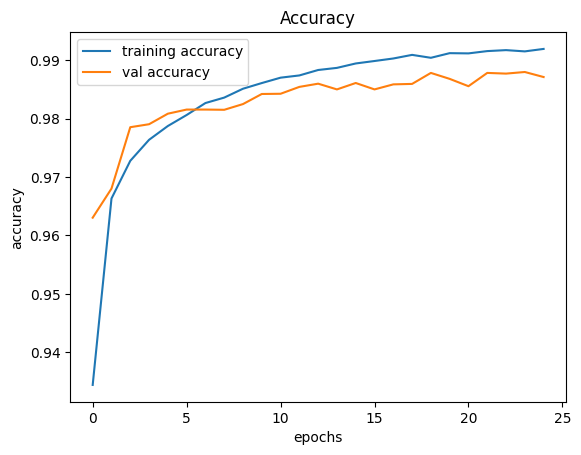

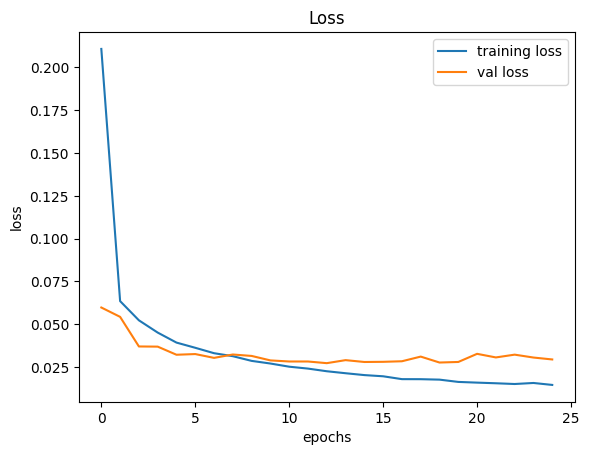

In [37]:
# Plotting performance graphs
plt.figure(0)
plt.plot(history.history['accuracy'], label='training accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

plt.figure(1)
plt.plot(history.history['loss'], label='training loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

In [38]:
# testing accuracy on test dataset
from sklearn.metrics import accuracy_score

# Importing the test dataset
y_test = pd.read_csv(r"D:\dataset\structhured_dataset\\Test.csv")

labels = y_test["classId"].values
imgs = y_test["filename"].values

data=[]

# Retreiving the images
with tf.device('/GPU:0'):
    for img in imgs:
        image = Image.open(r"D:\dataset\structhured_dataset\\Test\\"+img)
        image = image.convert("RGB")
        image = image.resize([100, 100])
        data.append(np.array(image))

X_test=np.array(data)

with tf.device('/GPU:0'):
    pred = np.argmax(model.predict(X_test), axis=-1)

print(accuracy_score(labels, pred))

1719/1719 ━━━━━━━━━━━━━━━━━━━━ 287s 163ms/step
0.9870708466686063


In [40]:
# Save the model in the native Keras format
model.save(r"D:\dataset\structhured_dataset\\finnish_traffic_sign_classifier_55_classes_new_dataset.keras")

In [3]:
class_labels = {
  "0": "A1.1",
  "1": "A1.2",
  "2": "A11",
  "3": "A13",
  "4": "A16",
  "5": "A17",
  "6": "A18",
  "7": "A2.2",
  "8": "A20.3",
  "9": "A22.1",
  "10": "A23",
  "11": "A33",
  "12": "A9",
  "13": "B1",
  "14": "B5",
  "15": "B6",
  "16": "C1",
  "17": "C17",
  "18": "C28",
  "19": "C29",
  "20": "C30",
  "21": "C31",
  "22": "C32",
  "23": "C32_2",
  "24": "C32_3",
  "25": "C32_5",
  "26": "C32_6",
  "27": "C32_7",
  "28": "C32_8",
  "29": "C32_9",
  "30": "D1.3",
  "31": "D1.4",
  "32": "D1.5",
  "33": "D1.6",
  "34": "D1.7",
  "35": "D2",
  "36": "D3.1",
  "37": "D3.2",
  "38": "A22.3_2",
  "39": "B5_2",
  "40": "C15",
  "41": "C19",
  "42": "C22_3",
  "43": "C34",
  "44": "C34_2",
  "45": "C37",
  "46": "C38",
  "47": "C39",
  "48": "D3",
  "49": "D6",
  "50": "D6_2",
  "51": "D6_3",
  "52": "E1",
  "53": "E1_2",
  "54": "E2",
  "55": "E23"
}


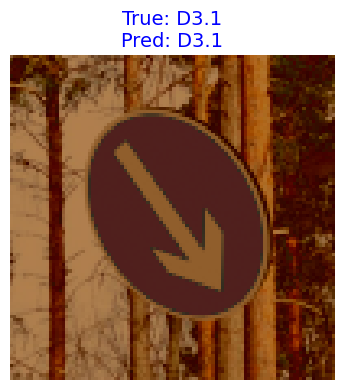

---------------------------------------------



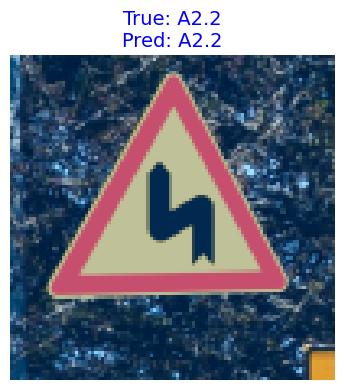

---------------------------------------------



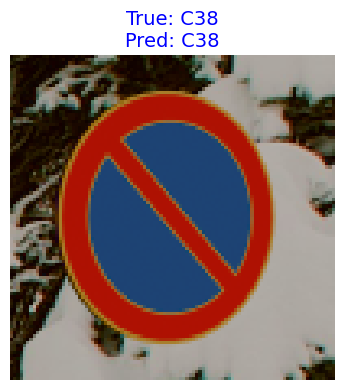

---------------------------------------------



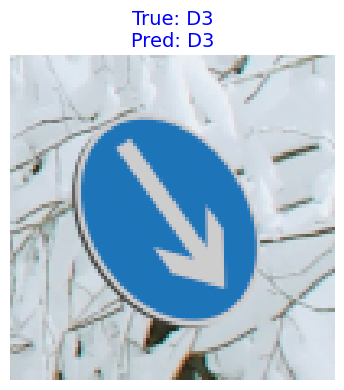

---------------------------------------------



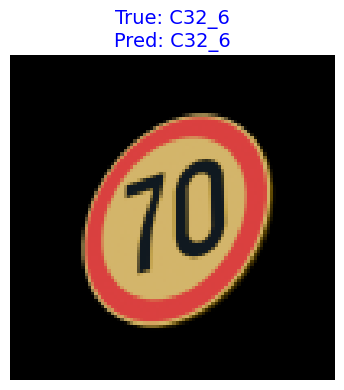

---------------------------------------------



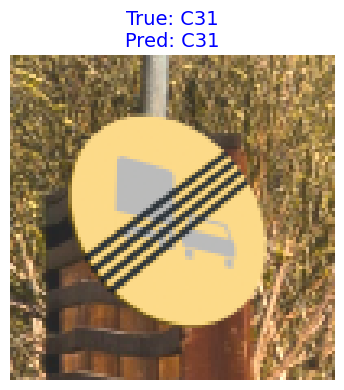

---------------------------------------------



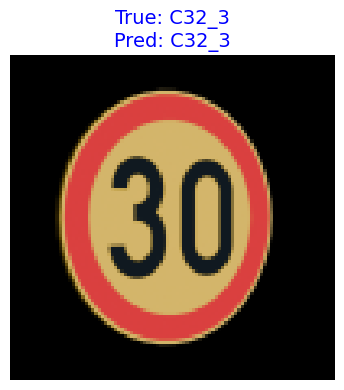

---------------------------------------------



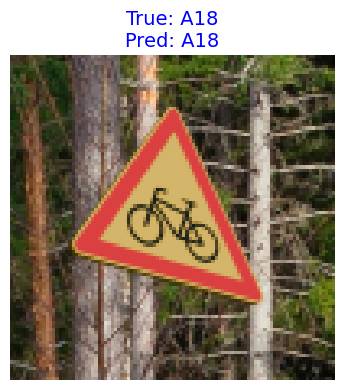

---------------------------------------------



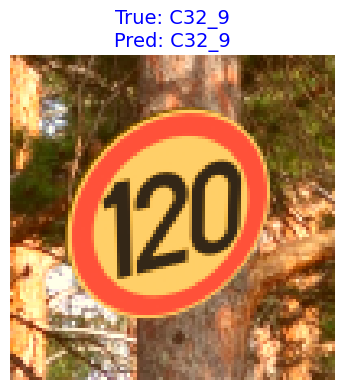

---------------------------------------------



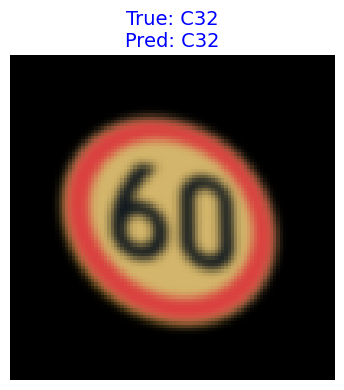

---------------------------------------------



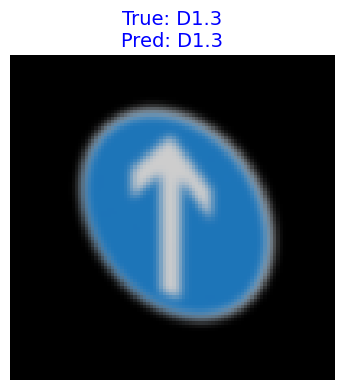

---------------------------------------------



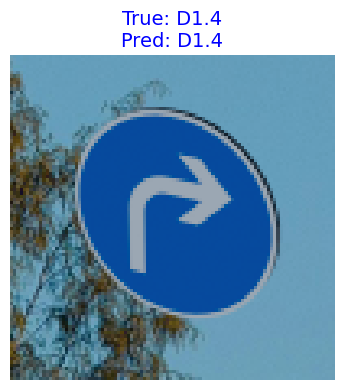

---------------------------------------------



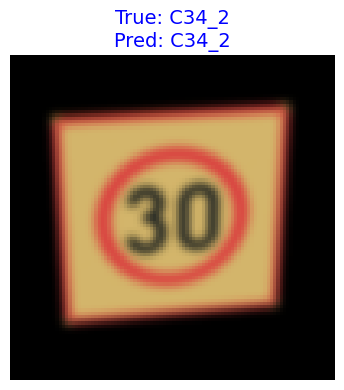

---------------------------------------------



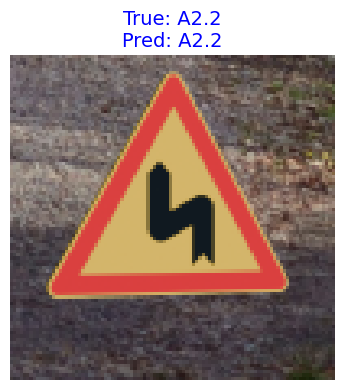

---------------------------------------------



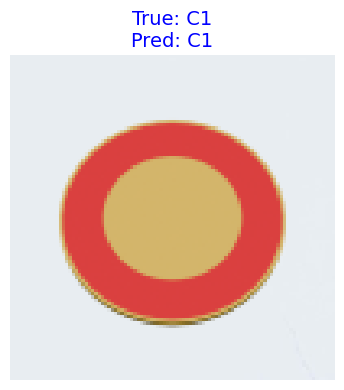

---------------------------------------------



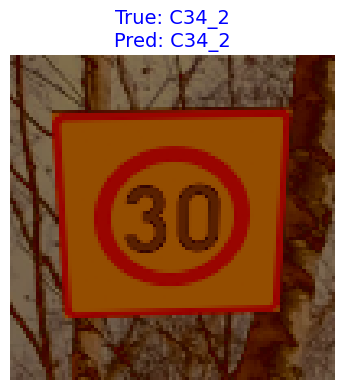

---------------------------------------------



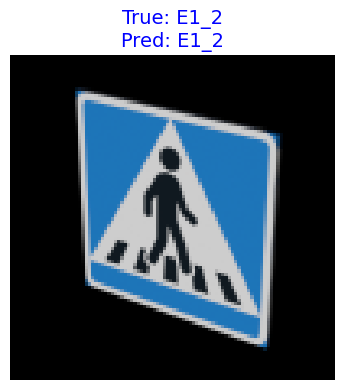

---------------------------------------------



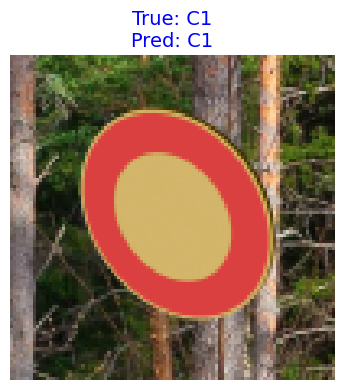

---------------------------------------------



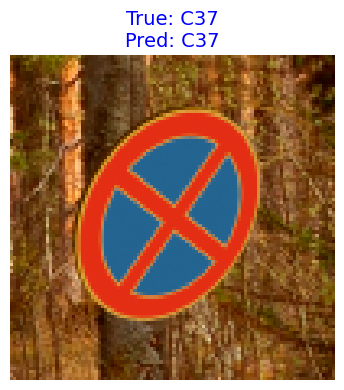

---------------------------------------------



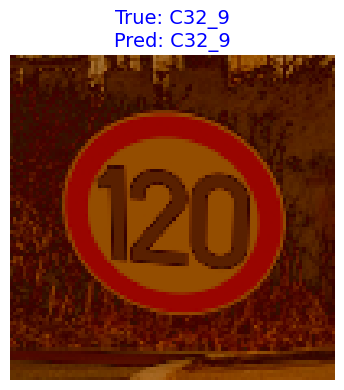

---------------------------------------------



In [42]:
# Number of samples to visualize
num_samples = 20

# Randomly select 20 images from the test set
indices = np.random.choice(len(X_test), num_samples, replace=False)
sample_images = X_test[indices]
true_labels = labels[indices]
predicted_labels = pred[indices]

# Function to display an image with true and predicted labels
def display_image_with_labels(image, true_label, predicted_label):
    plt.figure(figsize=(4, 4))  # Set the figure size for better visibility
    plt.imshow(image.astype('uint8'))  # Display the image
    plt.title(f"True: {class_labels[str(true_label)]}\nPred: {class_labels[str(predicted_label)]}", 
              fontsize=14, color='blue')  # Display class names with a readable font size
    plt.axis('off')  # Remove the axes for a cleaner look
    plt.tight_layout()
    plt.show()

# Display 20 images one by one with true and predicted labels
for i in range(num_samples):
    display_image_with_labels(sample_images[i], true_labels[i], predicted_labels[i])
    print("---------------------------------------------\n")


In [43]:
from sklearn.metrics import classification_report
# Classification report
report = classification_report(labels, pred, target_names=[str(i) for i in range(classes)])

print(report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       982
           1       1.00      1.00      1.00       982
           2       1.00      1.00      1.00       982
           3       1.00      1.00      1.00       982
           4       1.00      1.00      1.00       982
           5       1.00      1.00      1.00       982
           6       1.00      1.00      1.00       982
           7       1.00      1.00      1.00       982
           8       1.00      1.00      1.00       982
           9       1.00      1.00      1.00       982
          10       1.00      1.00      1.00       982
          11       1.00      1.00      1.00       982
          12       1.00      1.00      1.00       982
          13       1.00      1.00      1.00       982
          14       1.00      1.00      1.00       982
          15       1.00      1.00      1.00       982
          16       1.00      1.00      1.00       982
          17       1.00    

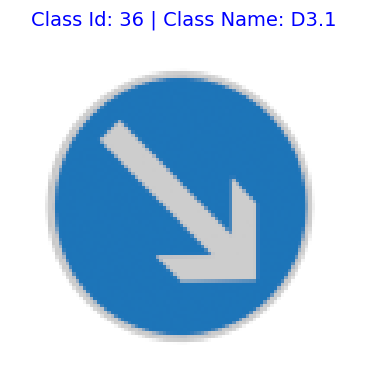

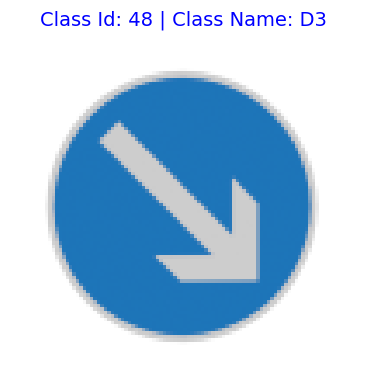

In [8]:
import os
from PIL import Image
import matplotlib.pyplot as plt

def display_image_with_labels(image, class_id, class_name):
    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.title(
        f"Class Id: {class_id} | Class Name: {class_name}",
        fontsize=14,
        color='blue'
    )
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
# Define the directories
class_36 = r"D:\dataset\structhured_dataset\train\36\D3.1_white_2_100px_0084.png"
class_48 = r"D:\dataset\structhured_dataset\train\48\D3_white_2_100px_0088.png"

img = Image.open(class_36)
display_image_with_labels(img, "36", "D3.1")

img = Image.open(class_48)
display_image_with_labels(img, "48", "D3")

### The Finnish Traffic Sign dataset has the same class in D3 and D3.1 which means it's not the issue in the model but the data itself so, we can say that this model has almost 100% accuracy.
##### https://github.com/finnishtransportagency/liikennemerkit/blob/master/collections/new_signs/svg/D3.svg
##### https://github.com/finnishtransportagency/liikennemerkit/blob/master/collections/new_signs/svg/D3.1.svg

## Both the classes are same in the dataset 

## Test Model Accuracy on real world data

In [17]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

model = tf.keras.models.load_model(r"D:\dataset\structhured_dataset\\finnish_traffic_sign_classifier_55_classes_new_dataset.keras")

# Root directory containing class-labeled subdirectories
root_dir = r'C:\Users\ali\workspace\jamk_thesis\thesis_work\creating_new_dataset\real_world_croped_images_dataset'

# Get the list of class names (subdirectory names)
classes = os.listdir(root_dir)

class_name_to_ids = {class_name: 48 if idx == "36" else int(idx) for idx, class_name in class_labels.items()}

image_paths = []
labels = []

# Loop over each class directory
for class_name in classes:
    class_dir = os.path.join(root_dir, class_name)
    if os.path.isdir(class_dir):
        for filename in os.listdir(class_dir):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                if class_name in class_name_to_ids:
                    image_path = os.path.join(class_dir, filename)
                    image_paths.append(image_path)
                    labels.append(class_name_to_ids[class_name])

data = []
sample_imgs = []

# Use GPU if available
with tf.device('/GPU:0'):
    for img_path in image_paths:
        image = Image.open(img_path)
        image = image.convert("RGB")
        sample_imgs.append(image.resize((100, 100)))
        image = image.resize((100, 100))
        data.append(np.array(image))

X_test = np.array(data)
X_test_disp = np.array(sample_imgs)
y_true = np.array(labels)
print("Sample Images Count: ", len(sample_imgs))

Sample Images Count:  135


In [18]:
with tf.device('/GPU:0'):
    predictions = model.predict(X_test)
    pred = np.argmax(predictions, axis=-1)
    pred = np.where(pred == 36, 48, pred)
    pred_conf = np.max(predictions, axis=-1)

4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/stepWARNING:tensorflow:6 out of the last 12 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x00000274FFDAFEC0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step  


In [19]:
accuracy = accuracy_score(y_true, pred)
print(f"Model Accuracy: {accuracy * 100:.2f}%")

Model Accuracy: 96.30%


In [20]:
import numpy as np
import matplotlib.pyplot as plt

def display_collage_with_labels(images, true_labels, predicted_labels, class_labels, confidences, num_cols=4):
    """
    Display a collage of images with true labels, predicted labels, and prediction confidence.

    :param images: Array of images
    :param true_labels: Array of true labels
    :param predicted_labels: Array of predicted labels
    :param class_labels: Dictionary mapping label indices to class names
    :param confidences: Array of prediction confidence scores (same order as predicted labels)
    :param num_cols: Number of columns in the collage
    """
    num_images = len(images)
    num_rows = (num_images + num_cols - 1) // num_cols  # Calculate number of rows needed

    plt.figure(figsize=(num_cols * 3, num_rows * 3))  # Set figure size dynamically

    for i in range(num_images):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(images[i].astype('uint8'))  # Display the image
        true_label = class_labels[str(true_labels[i])]
        predicted_label = class_labels[str(predicted_labels[i])]
        confidence = confidences[i]  # Get the confidence for the prediction
        plt.title(f"True: {true_label}\nPred: {predicted_label} ({confidence*100:.1f}%)", fontsize=10, color='blue')
        plt.axis('off')  # Remove axes for cleaner display

    plt.tight_layout()
    plt.show()

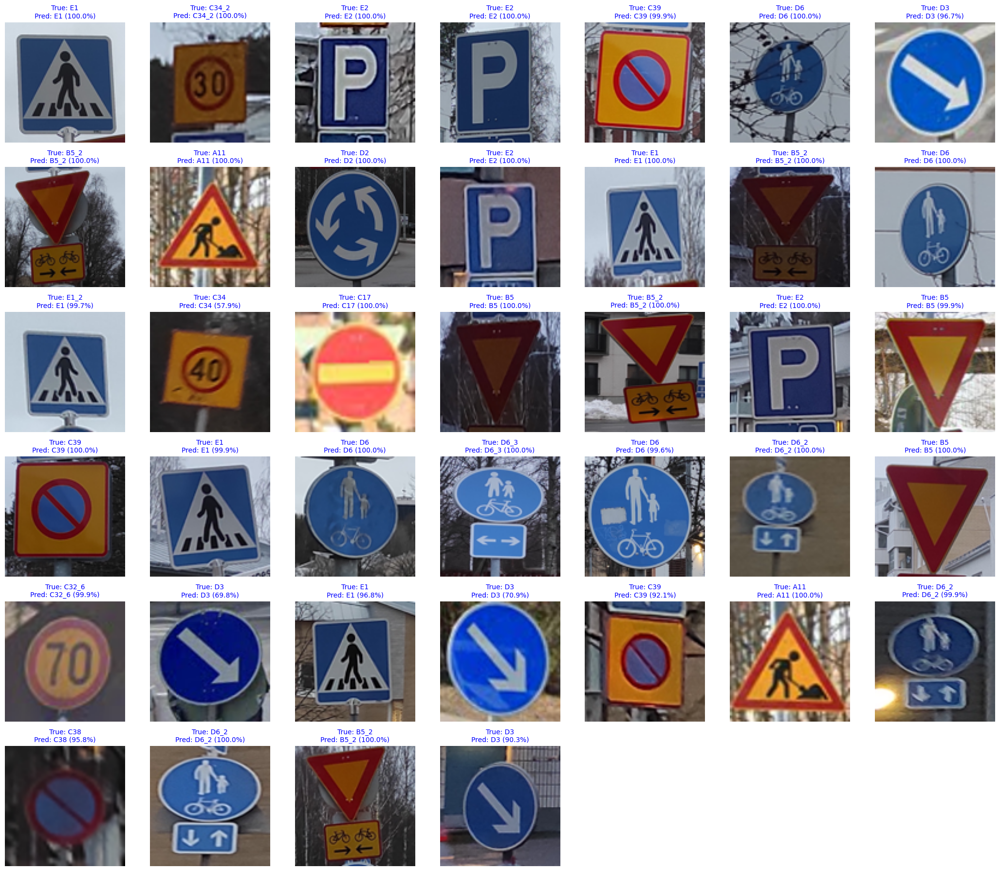

In [21]:
# Number of samples to visualize
num_samples = 39

# Randomly select samples from the test set
indices = np.random.choice(len(X_test), num_samples, replace=False)
sample_images = X_test_disp[indices]
true_labels = y_true[indices]
predicted_labels = pred[indices]
confidences = pred_conf[indices]

num_cols = 7
# Display the collage
display_collage_with_labels(sample_images, true_labels, predicted_labels, class_labels, confidences, num_cols=num_cols)

### Now, Let's check accuracy only on 38 classes test data

In [12]:
previous_38_classes = ['A1.1', 'A1.2', 'A11', 'A13', 'A16', 'A17', 'A18', 'A2.2', 'A20.3', 'A22.1', 'A23', 'A33', 'A9', 'B1', 'B5', 'B6', 'C1', 'C17', 'C28', 'C29', 'C30', 'C31', 'C32', 'C32_2', 'C32_3', 'C32_5', 'C32_6', 'C32_7', 'C32_8', 'C32_9', 'D1.3', 'D1.4', 'D1.5', 'D1.6', 'D1.7', 'D2', 'D3.1', 'D3.2']

In [22]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

model = tf.keras.models.load_model(r"D:\dataset\structhured_dataset\\finnish_traffic_sign_classifier_55_classes_new_dataset.keras")

# Root directory containing class-labeled subdirectories
root_dir = r'C:\Users\ali\workspace\jamk_thesis\thesis_work\creating_new_dataset\real_world_croped_images_dataset'

# Get the list of class names (subdirectory names)
classes = os.listdir(root_dir)

class_name_to_ids = {class_name: 36 if idx == "48" else int(idx) for idx, class_name in class_labels.items()}

image_paths = []
labels = []

# Loop over each class directory
for class_name in classes:
    class_dir = os.path.join(root_dir, class_name)
    if os.path.isdir(class_dir):
        for filename in os.listdir(class_dir):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                if class_name in class_name_to_ids and class_name in previous_38_classes:
                    image_path = os.path.join(class_dir, filename)
                    image_paths.append(image_path)
                    labels.append(class_name_to_ids[class_name])

data = []
sample_imgs = []

# Use GPU if available
with tf.device('/GPU:0'):
    for img_path in image_paths:
        image = Image.open(img_path)
        image = image.convert("RGB")
        sample_imgs.append(image.resize((100, 100)))
        image = image.resize((100, 100))
        data.append(np.array(image))

X_test = np.array(data)
X_test_disp = np.array(sample_imgs)
y_true = np.array(labels)
print("Sample Images Count: ", len(sample_imgs))

Sample Images Count:  39


In [23]:
with tf.device('/GPU:0'):
    predictions = model.predict(X_test)
    pred = np.argmax(predictions, axis=-1)
    pred = np.where(pred == 48, 36, pred)
    pred_conf = np.max(predictions, axis=-1)

2/2 ━━━━━━━━━━━━━━━━━━━━ 8s 5s/step


In [24]:
accuracy = accuracy_score(y_true, pred)
print(f"Model Accuracy: {accuracy * 100:.2f}%")

Model Accuracy: 100.00%


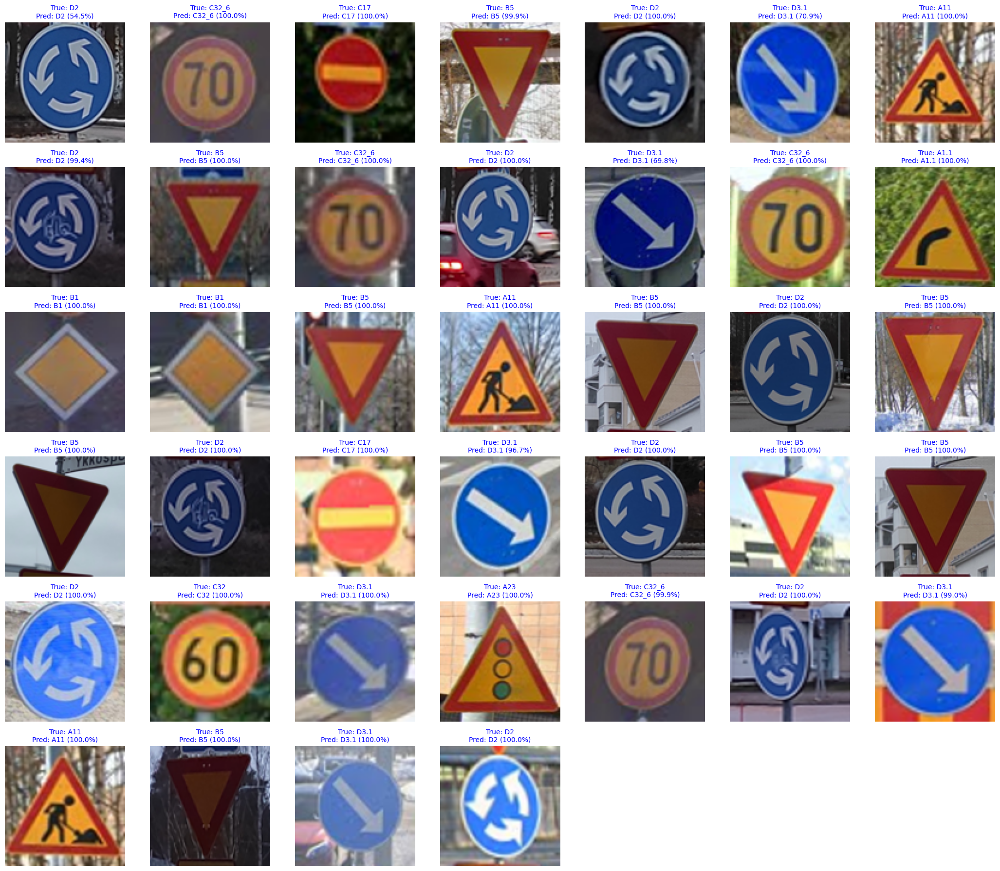

In [25]:
# Number of samples to visualize
num_samples = 39

# Randomly select samples from the test set
indices = np.random.choice(len(X_test), num_samples, replace=False)
sample_images = X_test_disp[indices]
true_labels = y_true[indices]
predicted_labels = pred[indices]
confidences = pred_conf[indices]

num_cols = 7
# Display the collage
display_collage_with_labels(sample_images, true_labels, predicted_labels, class_labels, confidences, num_cols=num_cols)